In [ ]:
# needs write access to data folder!
SaveModelState = False

In [ ]:
import os
import random
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.io as torchio
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision.transforms as transforms
import torchvision.datasets as tds
import matplotlib.pyplot as plt
import pandas as pd
import PIL

# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def get_model_name(name, batch_size, learning_rate, epoch):
    """ Generate a name for the model consisting of all the hyperparameter values

    Args:
        config: Configuration object containing the hyperparameters
    Returns:
        path: A string with the hyperparameter name and value concatenated
    """
    path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(name,batch_size,learning_rate,epoch)
    return path

# Save the current model (checkpoint) to a file
# model_path = get_model_name(xxx.name, batch_size, learning_rate, epoch)
# torch.save(xxx.state_dict(), model_path)
#--------------------------------------------------------------------------------------

class Autoencoder(nn.Module):
    # 32 is what the paper starts with
    def __init__(self, startOutCh = 32, depthRatio = 16 / 9):
        super(Autoencoder, self).__init__()

        # Added Name
        self.name = "AEhalf_sod{0}_odr{1:.2f}".format(startOutCh, depthRatio)
        self.startOutCh = startOutCh

        startOutCh2 = int(startOutCh * depthRatio)
        startOutCh3 = int(startOutCh2 * depthRatio)

        # half the # of convolutional blocks from the paper
        self.model = nn.Sequential(
            # encoder
            nn.Conv2d(in_channels=3, out_channels=startOutCh, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(4, 4),
            nn.Conv2d(startOutCh, startOutCh2, 3, 1, 1),
            nn.ReLU(),
            nn.MaxPool2d(4, 4),
            nn.Conv2d(startOutCh2, startOutCh3, 3, 1, 1),

            # decoder
            nn.ConvTranspose2d(startOutCh3, startOutCh2, 3, 1, 1),
            nn.ReLU(),
            nn.UpsamplingNearest2d(scale_factor=4),
            nn.ConvTranspose2d(startOutCh2, startOutCh, 3, 1, 1),
            nn.ReLU(),
            nn.UpsamplingNearest2d(scale_factor=4),
            nn.ConvTranspose2d(startOutCh, 3, 3, 1, 1)
        )

    def forward(self, x):
        return self.model(x)


def train(model, train_ds, valid_ds, model_dir, num_epochs=5, batch_size=1, lr=1e-3):
    torch.manual_seed(42)
    criterion = nn.MSELoss() # mean square error loss
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

    train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True)

    #outputs = []
    for epoch in range(num_epochs):
        for data in train_loader:
            noisy, truth = data
            recon = model(noisy)
            loss = criterion(recon, truth)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        print('Epoch:{}, Loss:{:.4f}'.format(epoch+1, float(loss)))
        plt.imshow(np.transpose(truth.detach().numpy()[0], (1, 2, 0)))
        plt.show()
        plt.imshow(np.transpose(recon.detach().numpy()[0], (1, 2, 0)))
        plt.show()

        if SaveModelState:
          # Save the current model (checkpoint) to a file
          model_path = get_model_name(model.name, batch_size, lr, epoch + 1)
          torch.save(model.state_dict(), os.path.join(model_dir, model_path))

        #outputs.append((epoch, img, recon),)
    #return outputs
    return truth, recon

#plt.imshow(np.transpose(final_recon[0][0].detach().numpy()), (1, 2, 0))

Epoch:1, Loss:0.0922


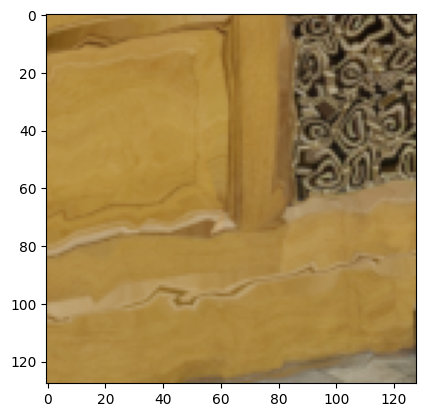

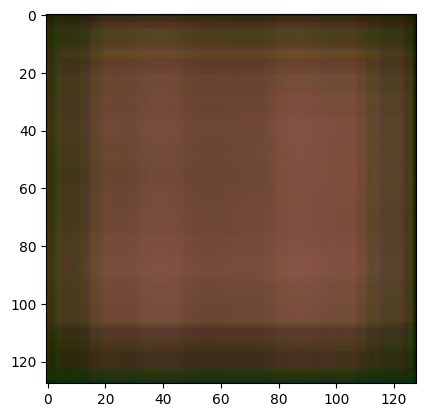

Epoch:2, Loss:0.0325


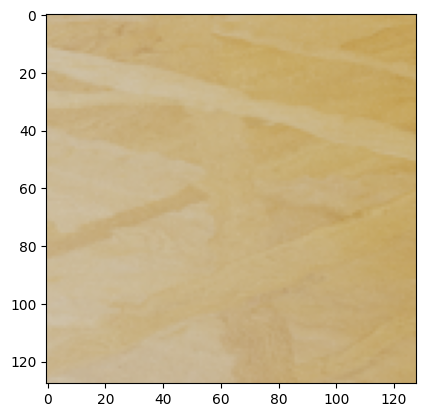

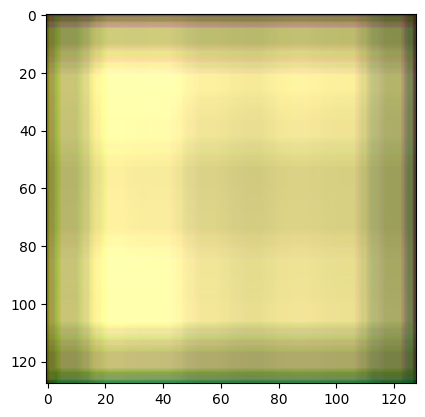

Epoch:3, Loss:0.0179


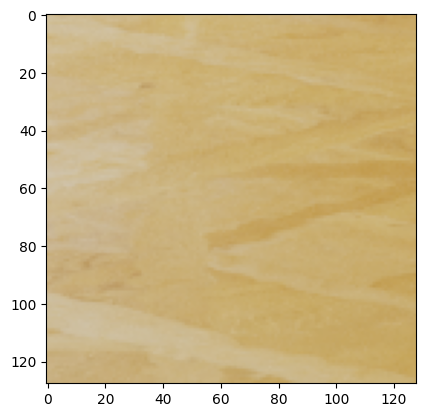

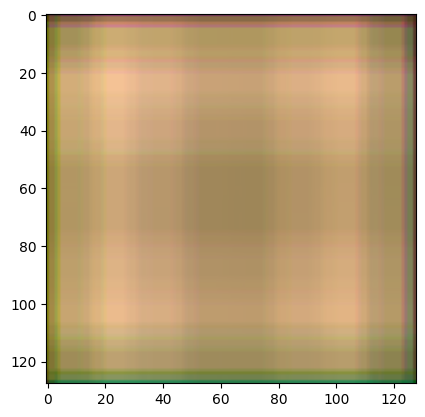

Epoch:4, Loss:0.0111


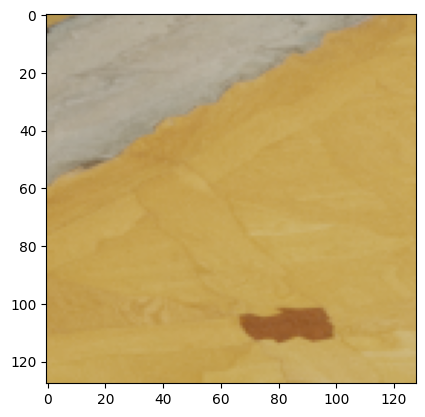

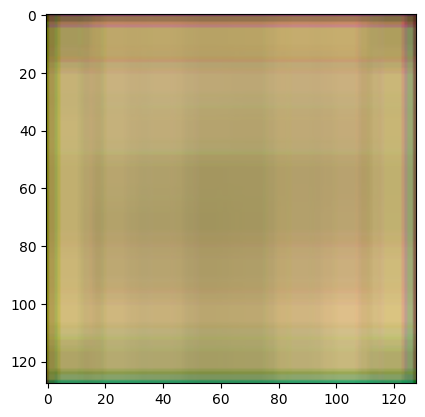

Epoch:5, Loss:0.0087


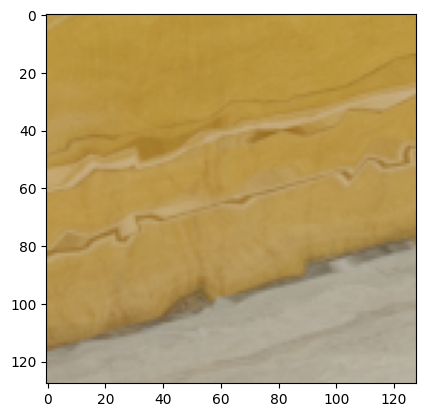

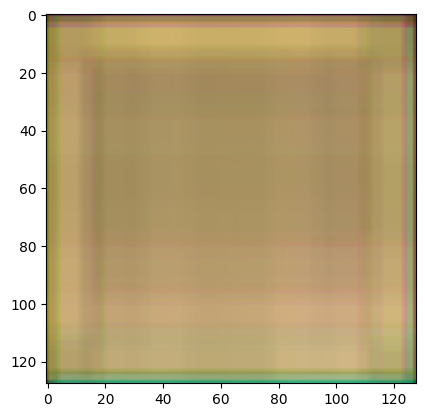

Epoch:6, Loss:0.0115


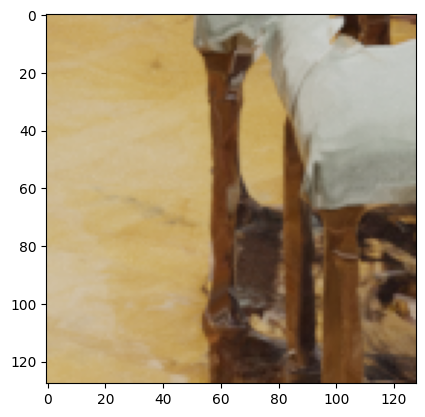

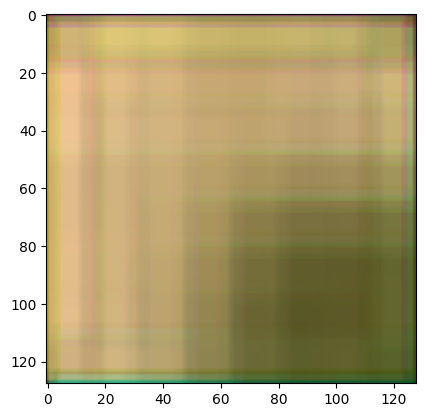

Epoch:7, Loss:0.0066


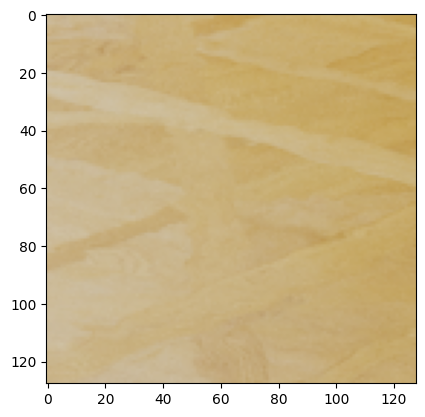

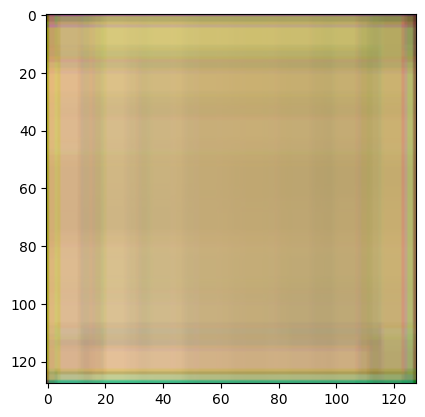

Epoch:8, Loss:0.0086


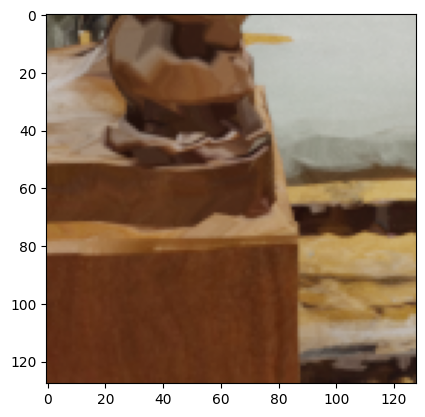

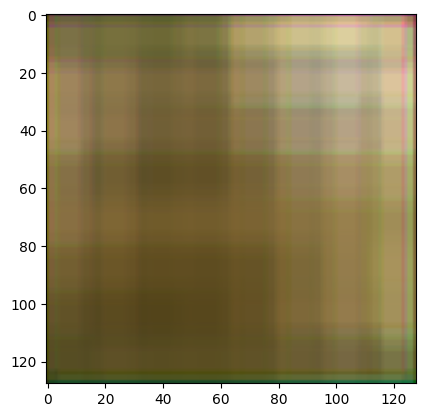

Epoch:9, Loss:0.0051


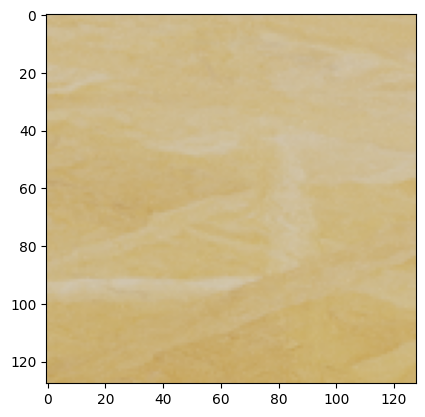

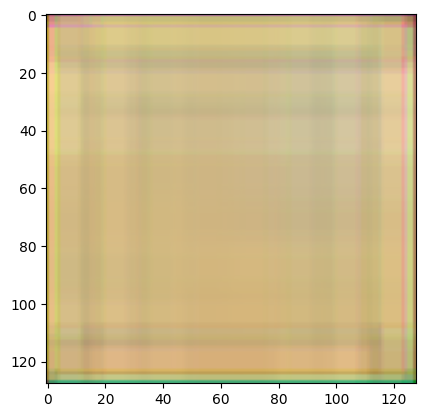

Epoch:10, Loss:0.0055


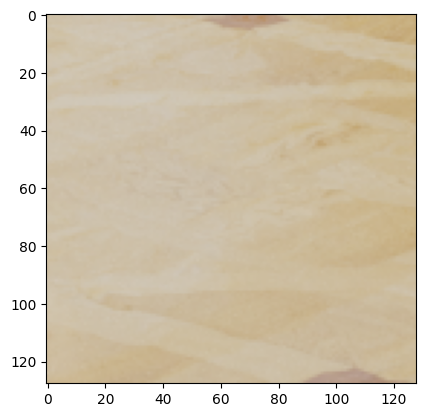

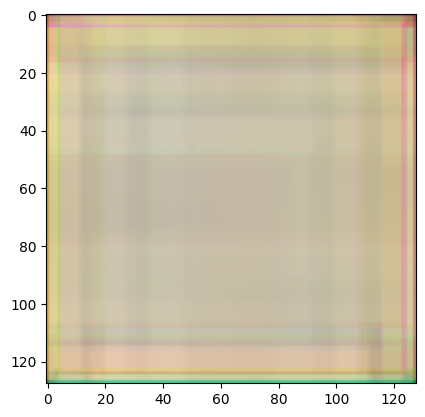

Epoch:11, Loss:0.0053


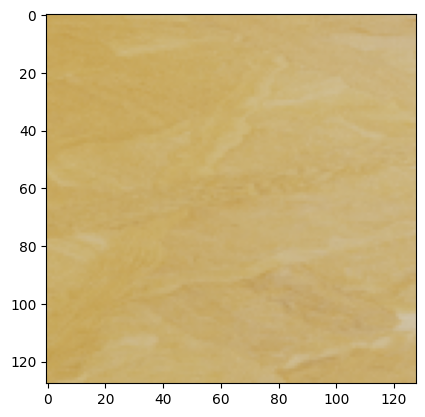

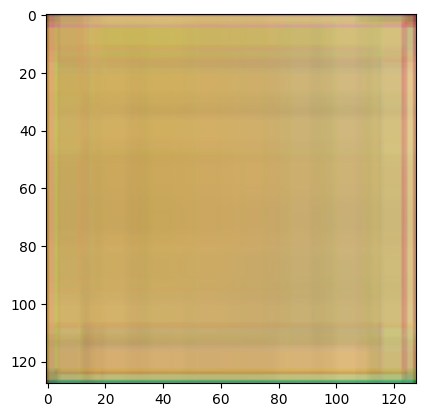

Epoch:12, Loss:0.0071


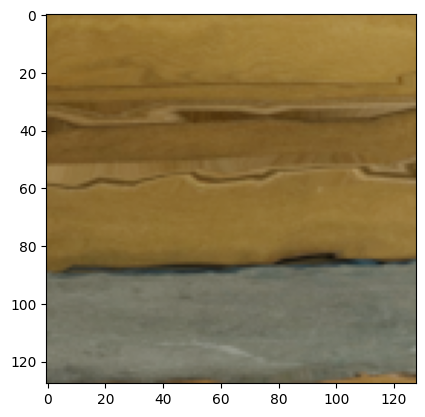

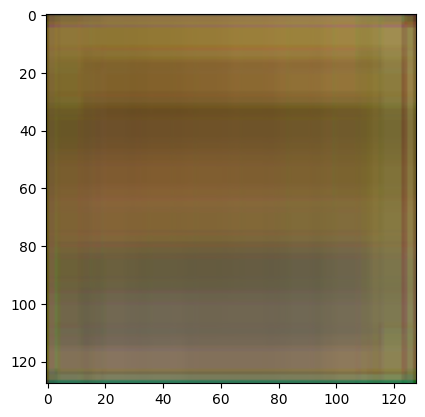

Epoch:13, Loss:0.0061


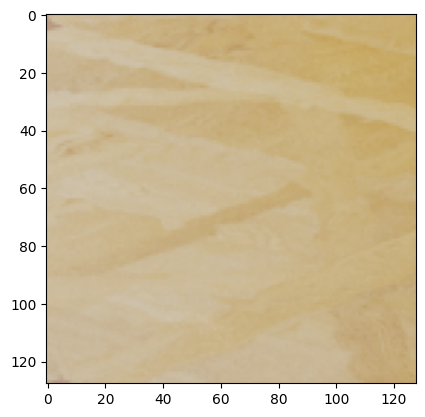

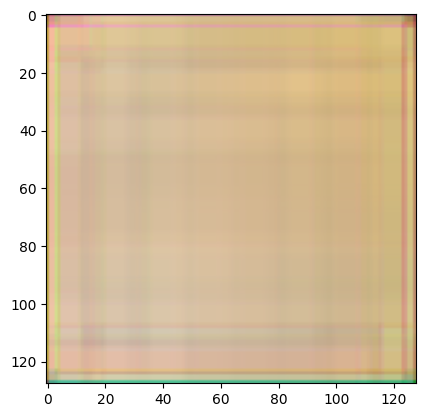

Epoch:14, Loss:0.0055


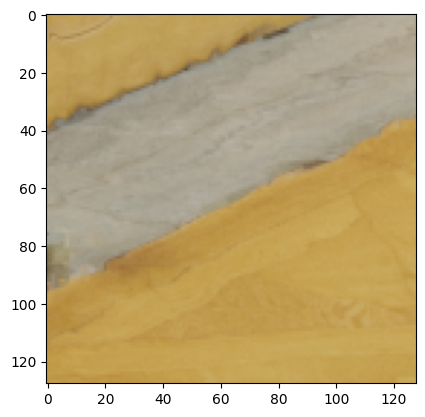

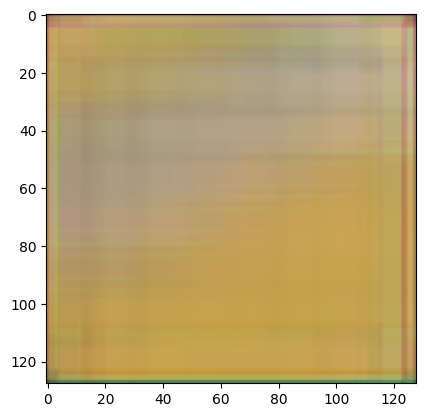

Epoch:15, Loss:0.0043


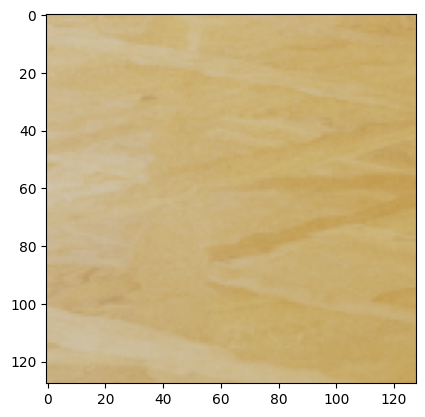

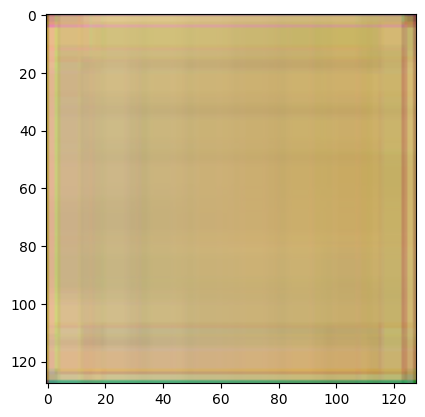

Epoch:16, Loss:0.0040


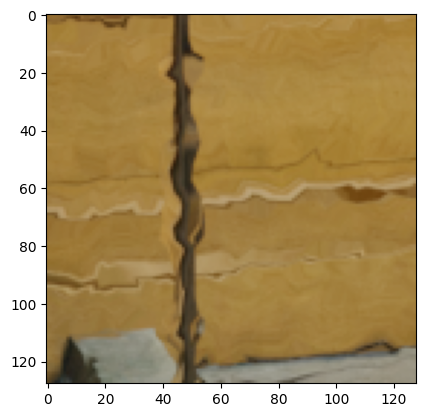

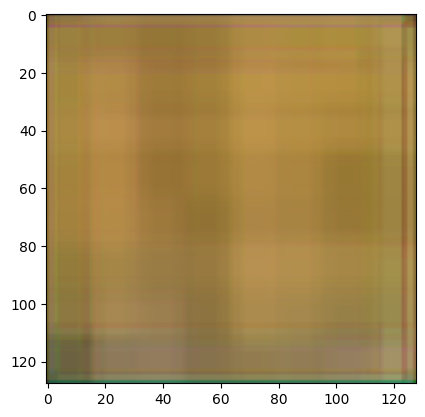

Epoch:17, Loss:0.0054


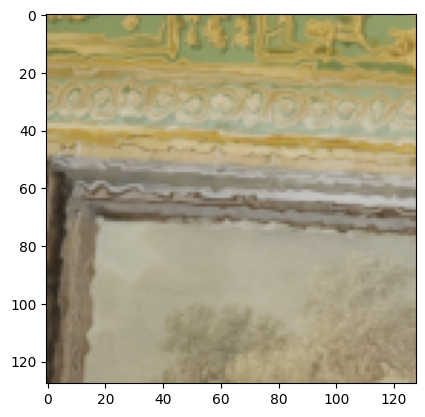

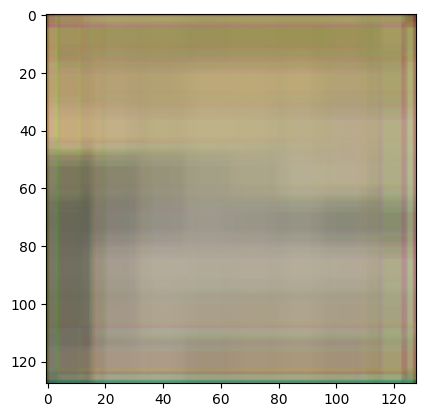

Epoch:18, Loss:0.0037


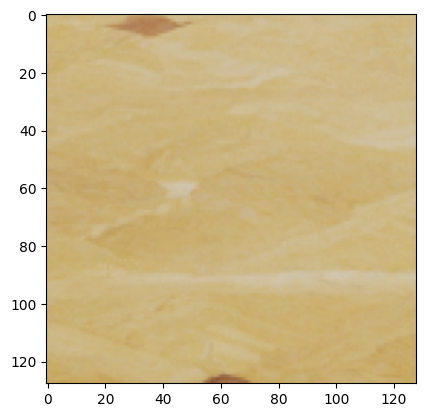

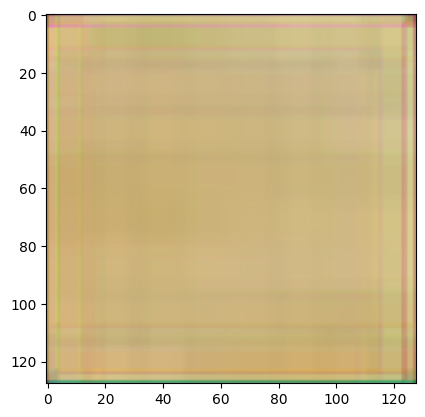

Epoch:19, Loss:0.0038


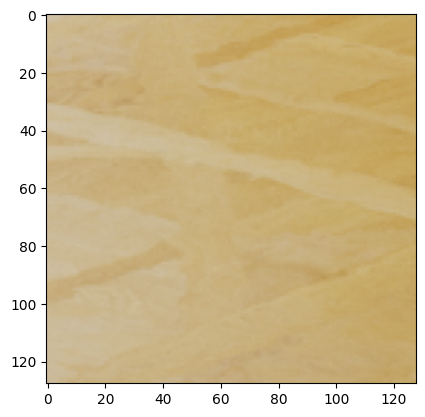

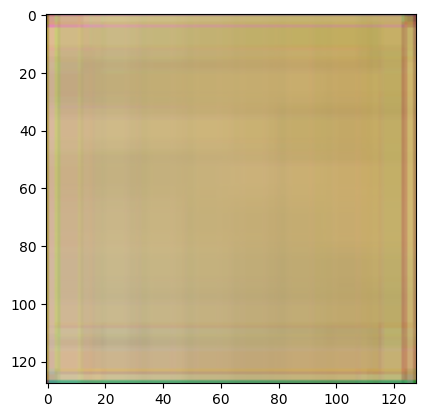

Epoch:20, Loss:0.0052


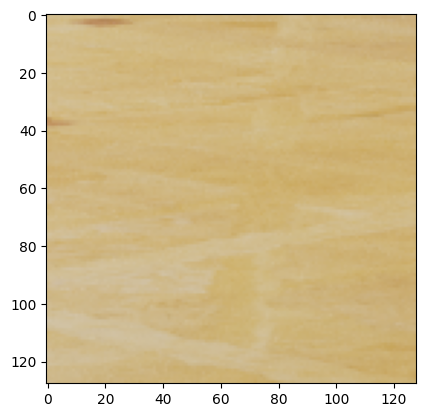

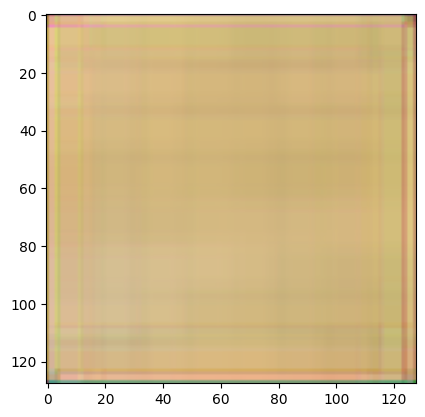

Epoch:21, Loss:0.0048


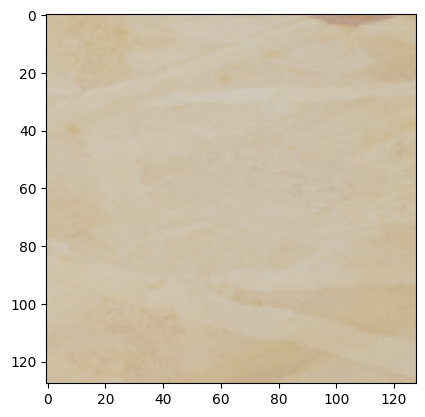

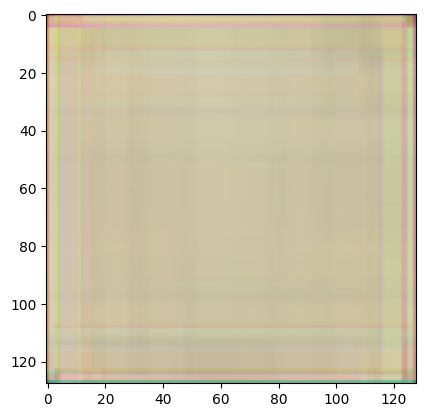

Epoch:22, Loss:0.0053


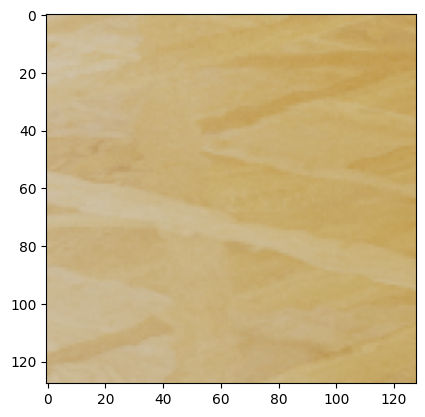

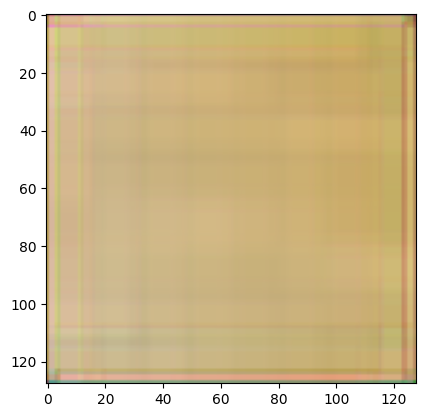

Epoch:23, Loss:0.0042


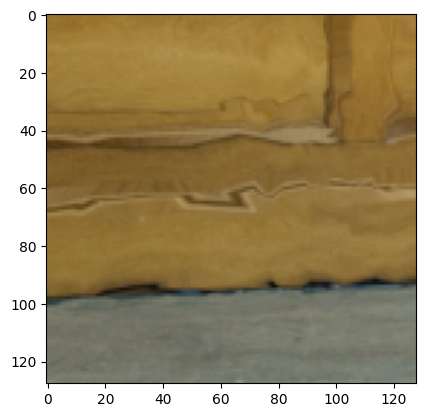

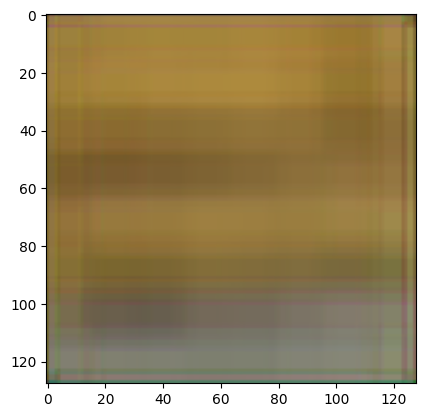

Epoch:24, Loss:0.0033


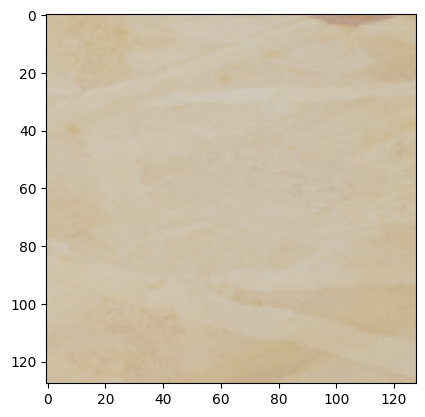

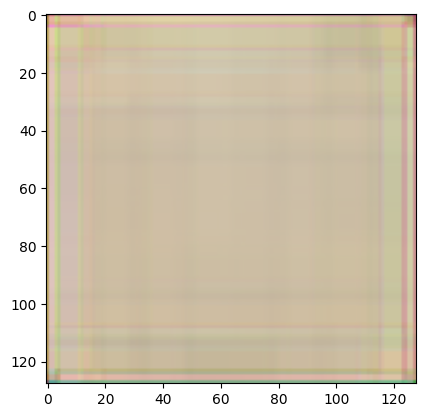

Epoch:25, Loss:0.0032


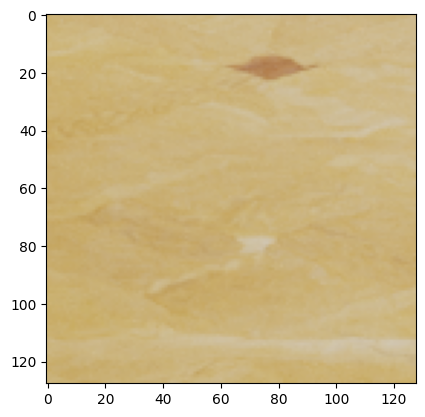

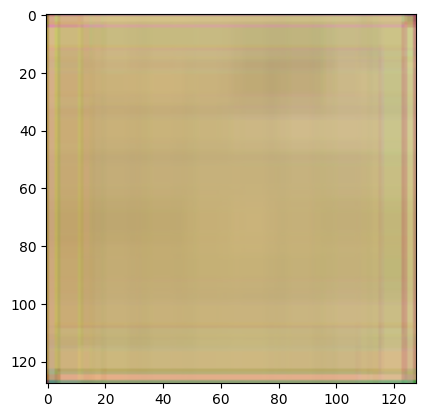

Epoch:26, Loss:0.0043


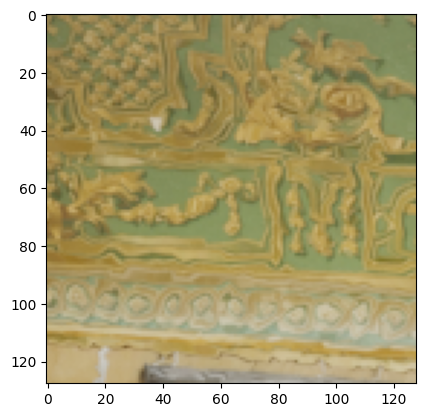

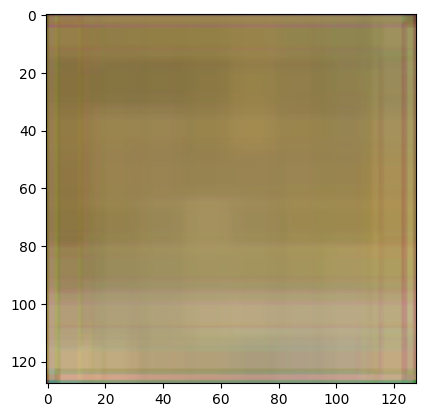

Epoch:27, Loss:0.0031


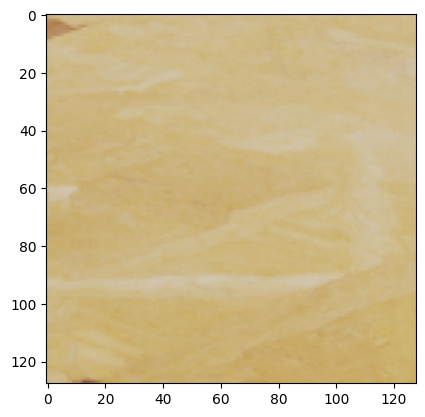

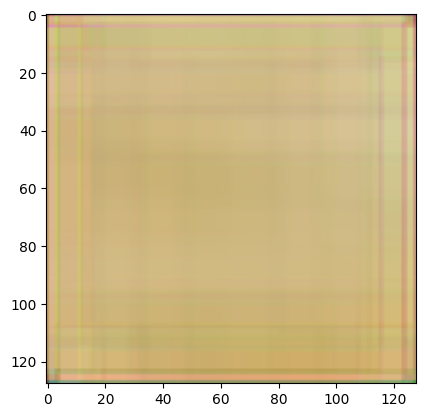

Epoch:28, Loss:0.0037


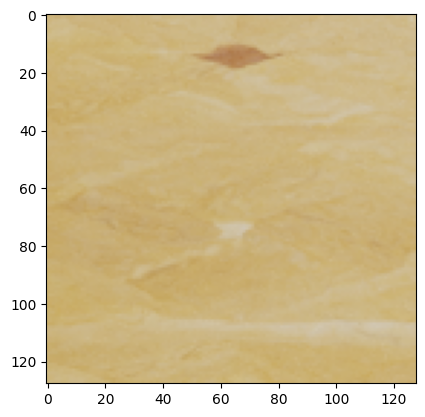

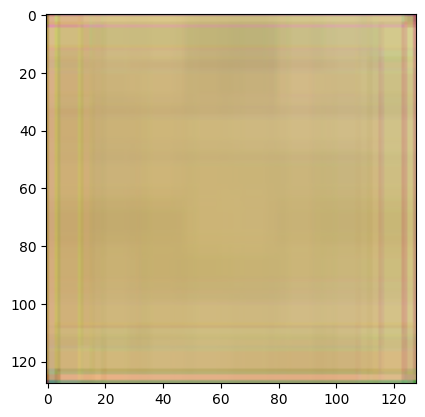

Epoch:29, Loss:0.0030


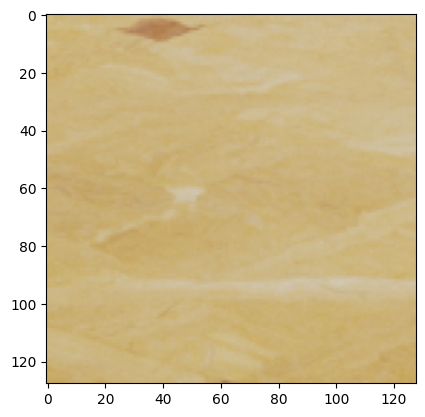

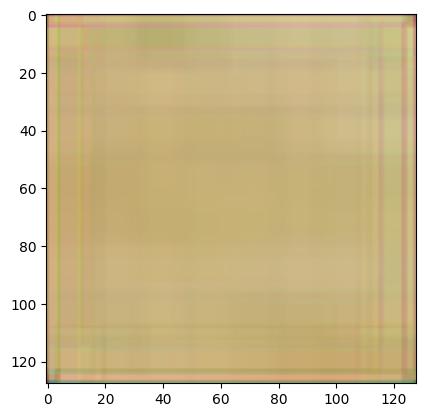

Epoch:30, Loss:0.0034


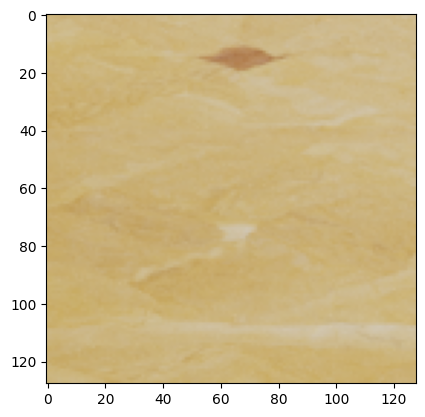

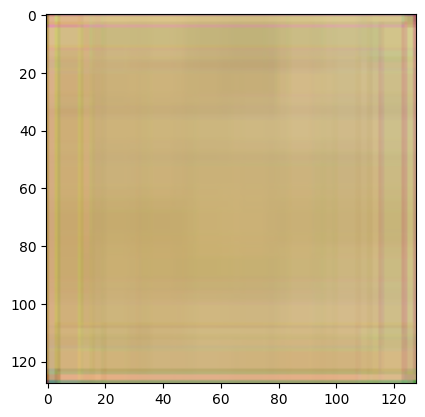

Epoch:31, Loss:0.0030


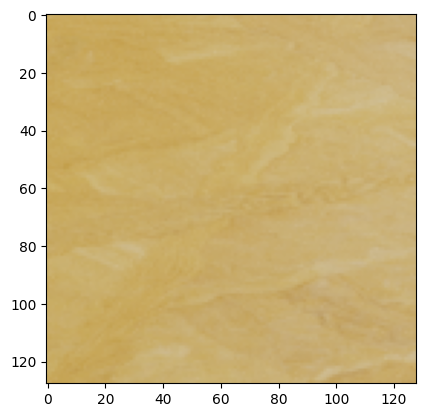

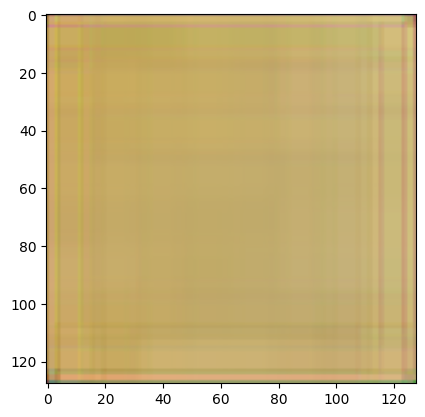

Epoch:32, Loss:0.0049


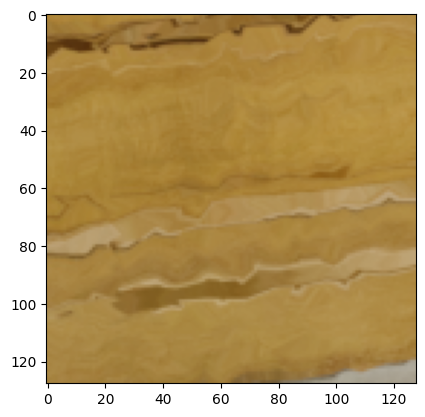

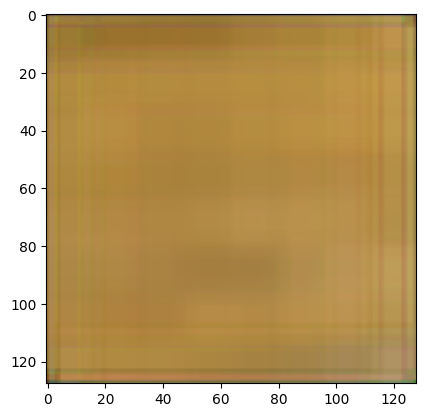

Epoch:33, Loss:0.0033


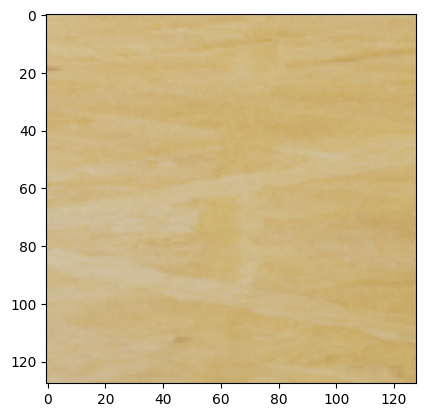

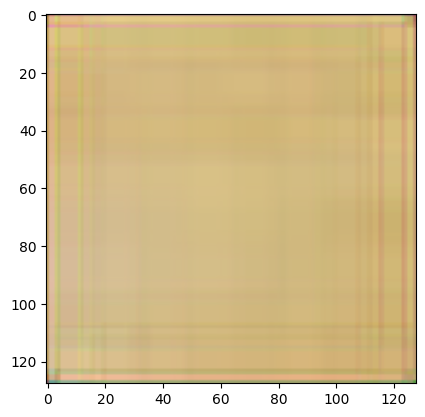

Epoch:34, Loss:0.0028


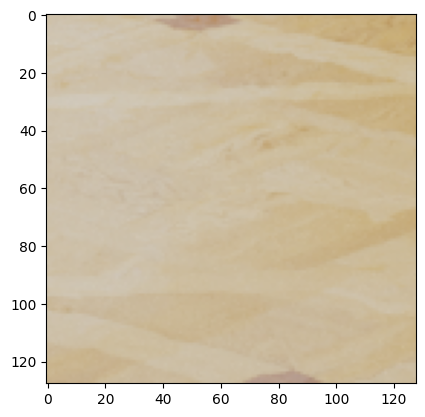

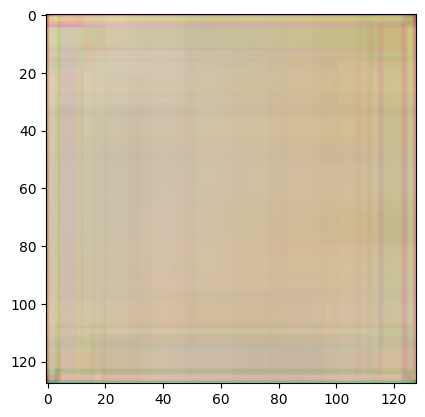

Epoch:35, Loss:0.0024


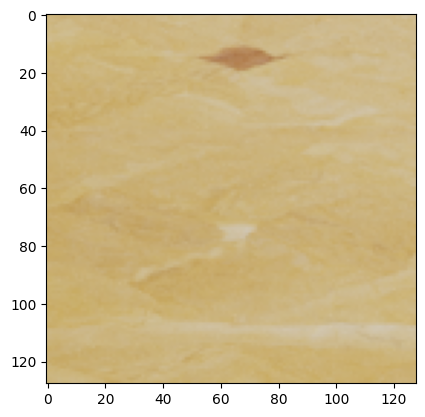

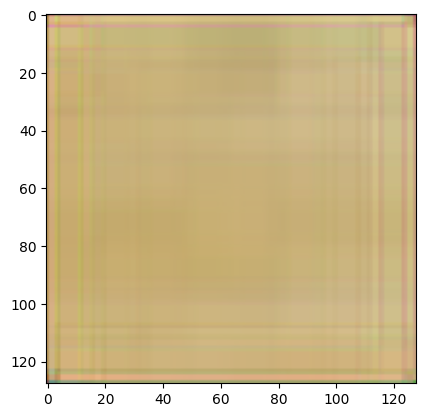

Epoch:36, Loss:0.0025


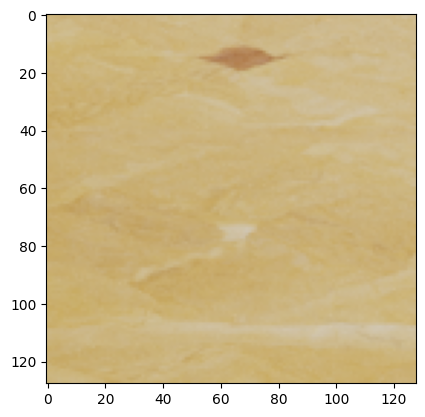

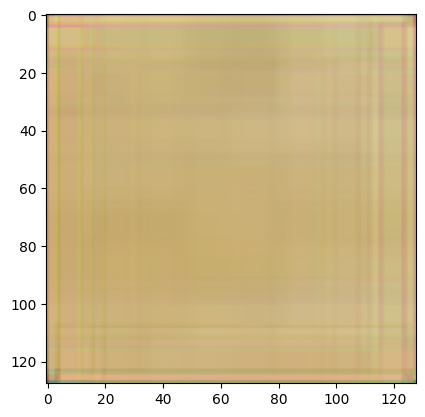

Epoch:37, Loss:0.0039


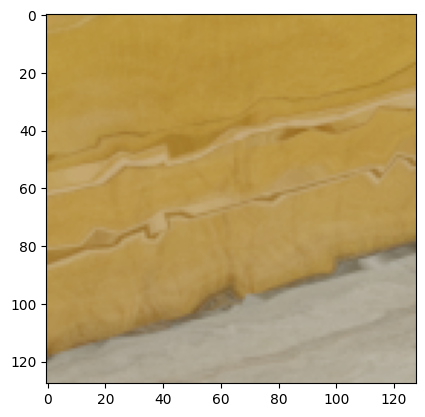

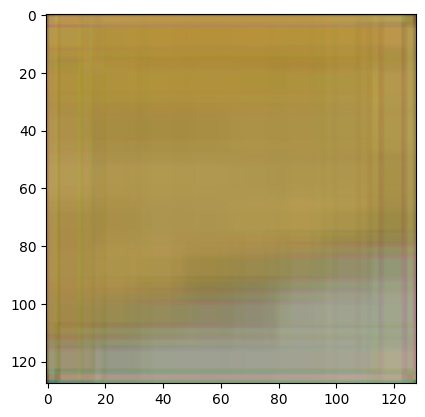

Epoch:38, Loss:0.0039


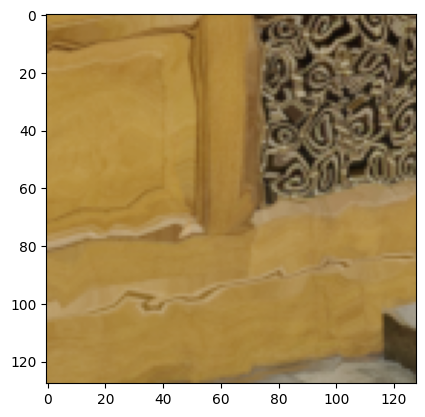

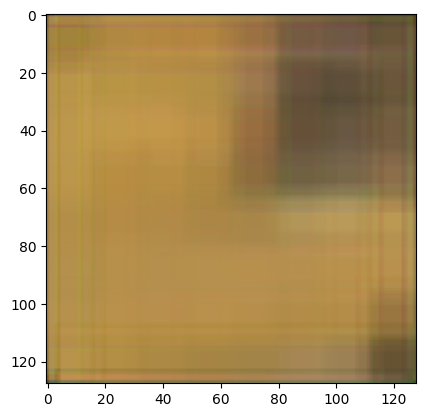

Epoch:39, Loss:0.0027


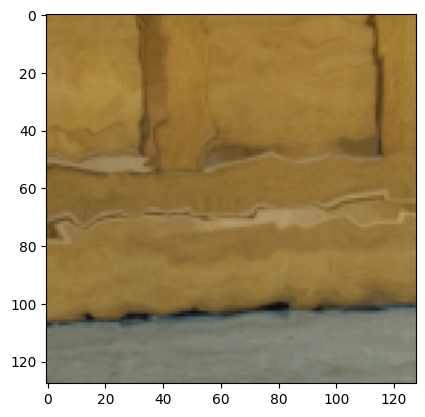

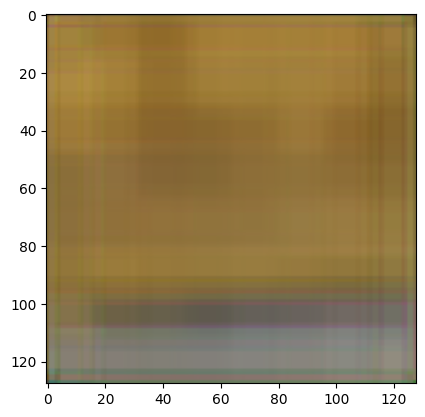

Epoch:40, Loss:0.0034


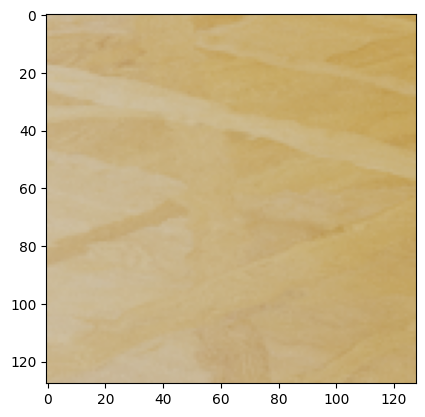

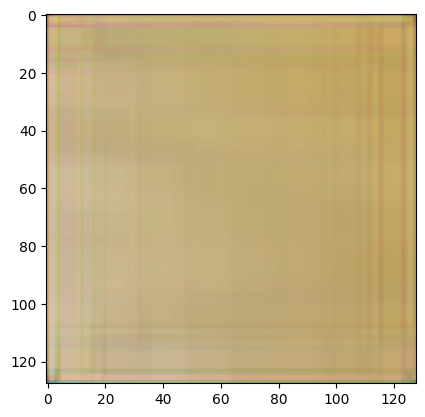

Epoch:41, Loss:0.0023


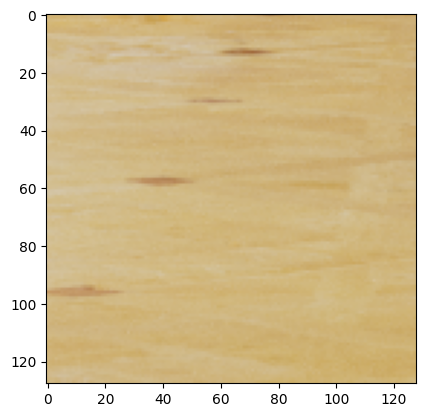

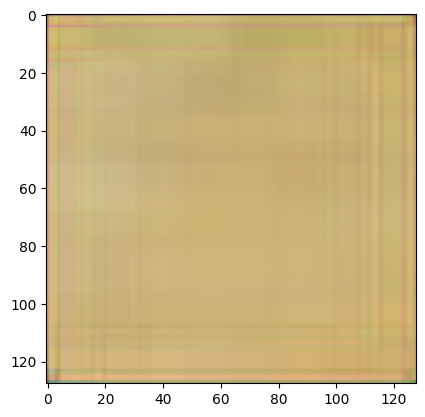

Epoch:42, Loss:0.0023


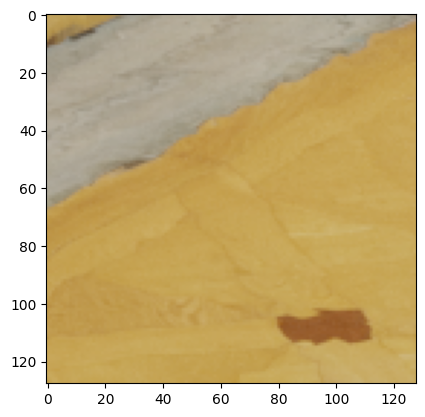

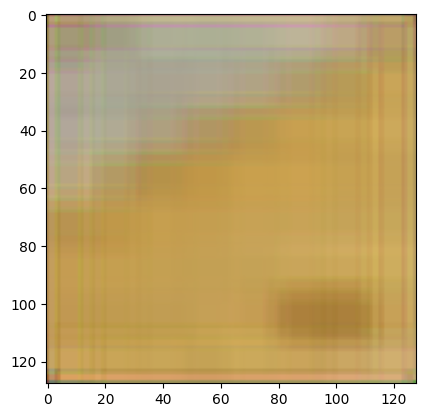

Epoch:43, Loss:0.0041


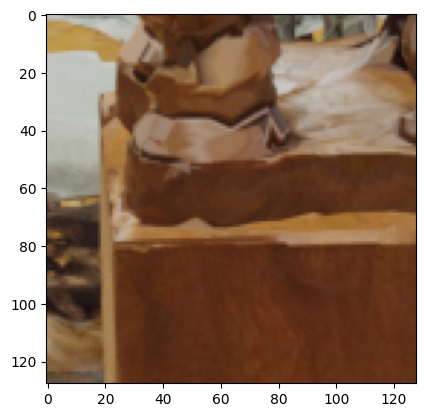

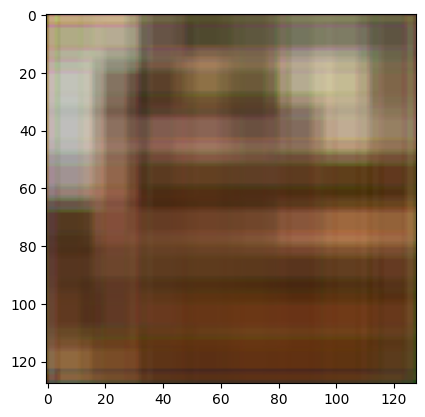

Epoch:44, Loss:0.0031


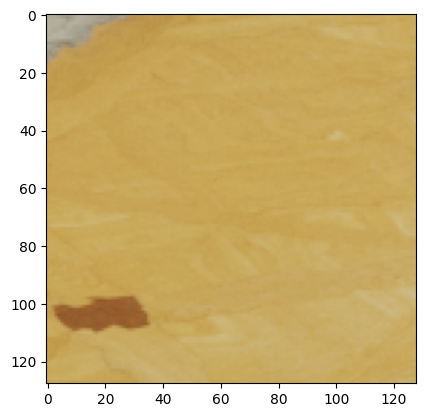

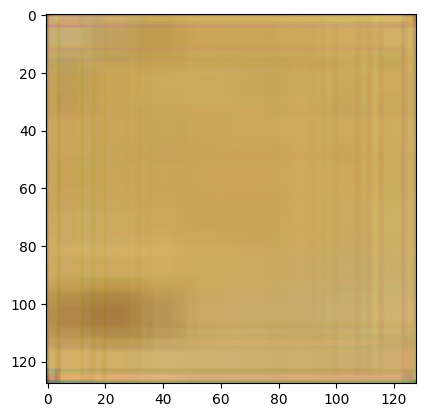

Epoch:45, Loss:0.0036


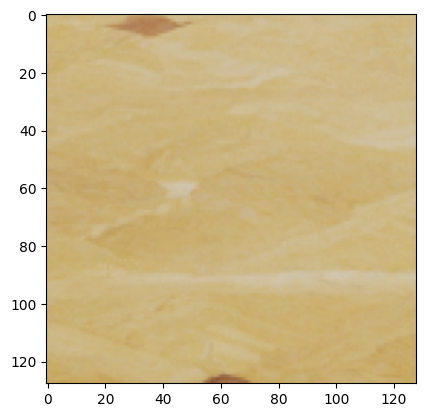

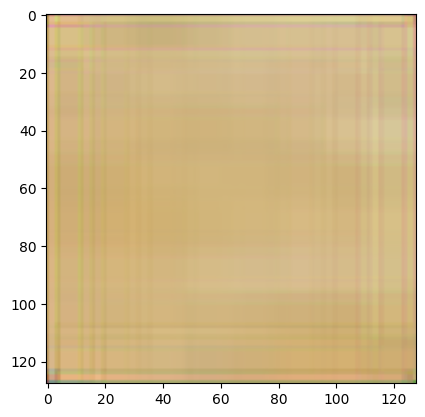

Epoch:46, Loss:0.0024


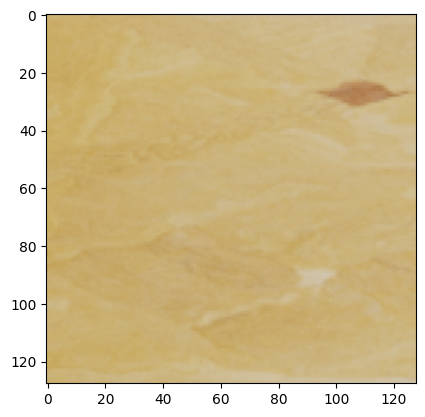

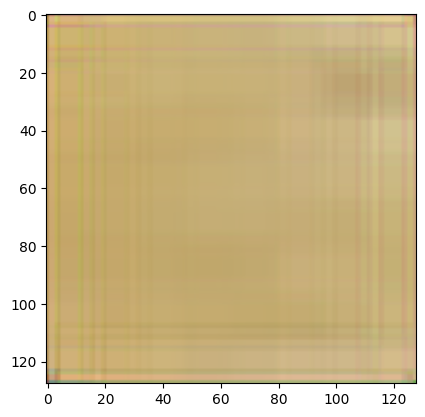

Epoch:47, Loss:0.0028


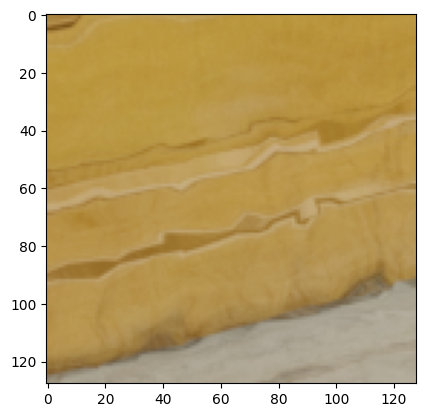

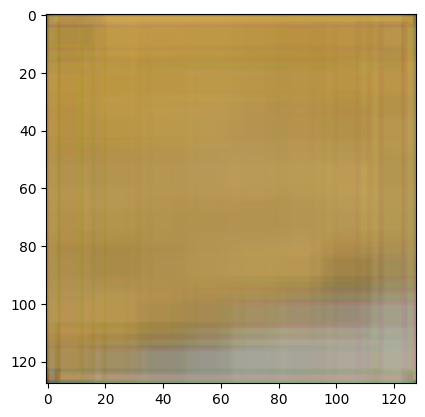

Epoch:48, Loss:0.0027


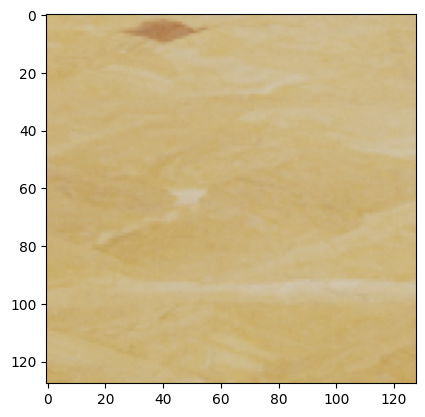

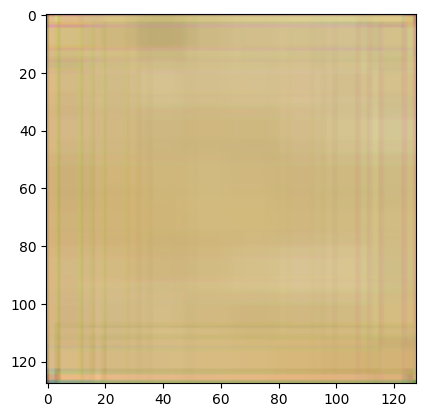

Epoch:49, Loss:0.0039


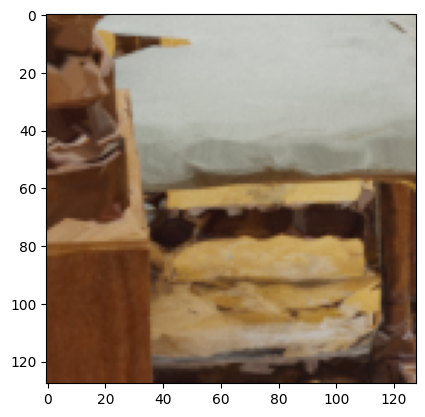

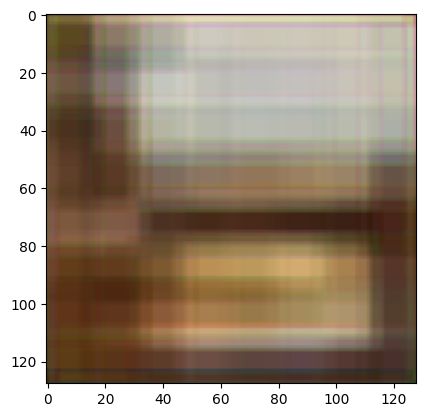

Epoch:50, Loss:0.0029


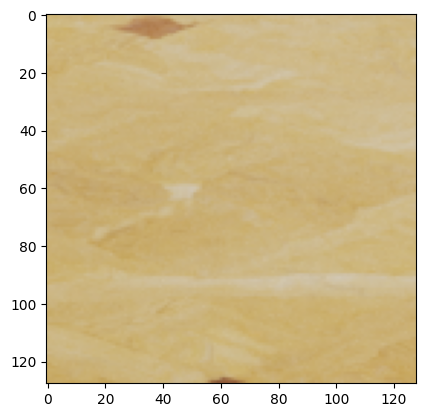

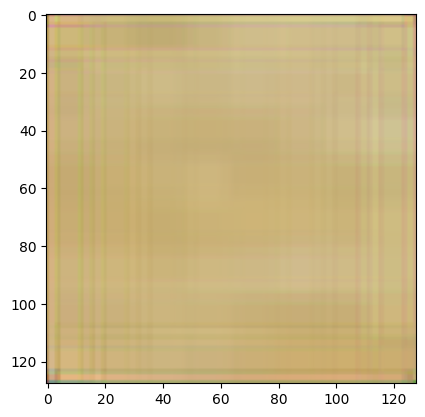

In [5]:
# Address for Datasets within the Drive
truthPaths = ["/content/drive/MyDrive/data/baseline_data/animations/anim1/4096/",
              "/content/drive/MyDrive/data/baseline_data/animations/anim2/4096/"]
noisyPaths = ["/content/drive/MyDrive/data/baseline_data/animations/anim1/1/",
              "/content/drive/MyDrive/data/baseline_data/animations/anim2/1/"]

def get_io_paths(noisy_dirs, truth_dirs):
  """
        noisy_dirs: List of noisy image directories.
        truth_dirs: List of truth image directories.
  """
  assert len(noisy_dirs) == len(truth_dirs)

  paths = []
  for i in range(len(noisy_dirs)):
    nfiles = [os.path.join(noisy_dirs[i], f) for f in os.listdir(noisy_dirs[i])]
    tfiles = [os.path.join(truth_dirs[i], f) for f in os.listdir(truth_dirs[i])]
    nfiles.sort()
    tfiles.sort()
    assert len(nfiles) == len(tfiles)
    paths.extend(zip(nfiles, tfiles))

  return paths

# this is the only thing that works to avoid running out of RAM in Colab
class ImagesDataset(torch.utils.data.Dataset):
    def __init__(self, io_paths, transform=None):
        """
        io_paths: list of tuples of input-output image paths.
        transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.paths = io_paths
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
      noisy_img = torchio.read_image(self.paths[idx][0], torchio.ImageReadMode.RGB).to(torch.float)
      truth_img = torchio.read_image(self.paths[idx][1], torchio.ImageReadMode.RGB).to(torch.float)
      noisy_img /= 255.
      truth_img /= 255.

      if (self.transform):
        noisy_img = self.transform(noisy_img)
        truth_img = self.transform(truth_img)

      return [noisy_img, truth_img]

train_split = 0.7
valid_split = 0.15
test_split = 0.15

paths = get_io_paths(noisyPaths, truthPaths)
random.shuffle(paths)
train_eidx = int(len(paths) * train_split)
valid_eidx = int(len(paths) * (train_split + valid_split))

trans128 = transforms.CenterCrop(size=128)
train_ds = ImagesDataset(paths[:train_eidx], transform=trans128)
valid_ds = ImagesDataset(paths[train_eidx:valid_eidx], transform=trans128)
test_ds = ImagesDataset(paths[valid_eidx:], transform=trans128)


model = Autoencoder(depthRatio=16/3)
model_dir = "/content/drive/MyDrive/data/nnmodel/{}".format(model.name)
if SaveModelState and not os.path.exists(model_dir):
  os.mkdir(model_dir)

if SaveModelState:
  fpaths = open(os.path.join(model_dir, "paths.txt"), "w")
  fpaths.write("split={0},{1},{2}".format(train_split, valid_split, test_split) + "\n")
  for p in paths:
    fpaths.write(str(p) + "\n")
  fpaths.close()

final_truth, final_recon = train(model, model_dir, train_ds, valid_ds, batch_size=32, num_epochs=50, lr=1e-3)

#train_loader = torch.utils.data.DataLoader(train_ds, batch_size=1, shuffle=True, num_workers=2)
#plt.imshow(np.transpose(np.array(next(iter(train_loader))[0][0]), (1, 2, 0)))

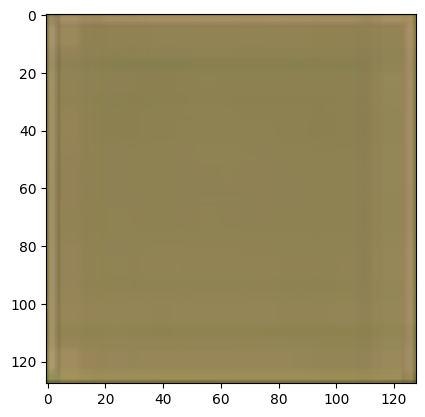

In [ ]:
plt.imshow(np.transpose(final_recon.detach().numpy()[0], (1, 2, 0)))

In [7]:
%%shell
jupyter nbconvert --to html "/content/APS360Project140723.ipynb"

[NbConvertApp] Converting notebook /content/APS360Project140723.ipynb to html
[NbConvertApp] Writing 12291697 bytes to /content/APS360Project140723.html
